# California Season Prediction

## Imports and Functions

In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.gaussian_process import GaussianProcessRegressor


from sklearn.svm import SVR
import os
import matplotlib.pyplot as plt
import numpy as np
from xgboost import XGBRegressor

In [2]:
# Add the folder to the Python path

os.chdir("../../")
# change working directory to project's root path
print(os.getcwd())

FIRST_YEAR= 2000

c:\Users\marti\Desktop\data\hw_extra


In [3]:
def model_predict(data, regressor, len_pred):

    data['Date'] = pd.to_datetime(data['Date'])
    data['Date'] = data['Date'].dt.to_period('M').astype(str)

    indices_of_interest = ["HWN", "HWF", "HWD", "HWM", "HWA"]
    features = data.columns.difference(["Date"]+ indices_of_interest)

    # Iterate over each index to create and evaluate models
    fig, axs = plt.subplots(5, 1, figsize=(25,15))

    mae_errors = []
    mae_errors_training = []
    r2_scores = []
    r2_scores_training = []
    for i in range(len(indices_of_interest)):
        X = data[features]
        y = data[indices_of_interest[i]]
        dates = data["Date"]
        
        # Split into training and testing sets
        X_train, X_test, y_train, y_test = X[:-len_pred], X[-len_pred:], y[:-len_pred], y[-len_pred:]
        train_dates, test_dates = dates[:-len_pred], dates[-len_pred:]
        
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        y_pred_train = regressor.predict(X_train)
        
        # Evaluation
        mae_errors.append(mean_absolute_error(y_test, y_pred))
        mae_errors_training.append(mean_absolute_error(y_train, y_pred_train))
        r2_scores.append(r2_score(y_test, y_pred))
        r2_scores_training.append(r2_score(y_train, y_pred_train))
        

        # Plot training values
        axs[i].plot(
            train_dates,
            y_train,
            label="Training",
            marker='o',
            color='green',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            train_dates,
            y_pred_train,
            label="Predicted Training",
            marker='x',
            color='red',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            test_dates,
            y_test,
            label="Test",
            marker='o',
            color='blue',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            test_dates,
            y_pred,
            label="Predicted Test",
            marker='x',
            color='red',
            linestyle='--',
            linewidth=1.5
        )
        axs[i].set_title(f"Prediction for {indices_of_interest[i]}")
        axs[i].legend()
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return [mae_errors, mae_errors_training, r2_scores, r2_scores_training]


In [4]:
data = {i: pd.read_csv(f"data/features/california/from{FIRST_YEAR}/HWs_cali_features_biseason_{i}.csv") for i in range(1,13)}

##   DJ-JF-FM

### Linear Regression

In [5]:
linear_stats = {}

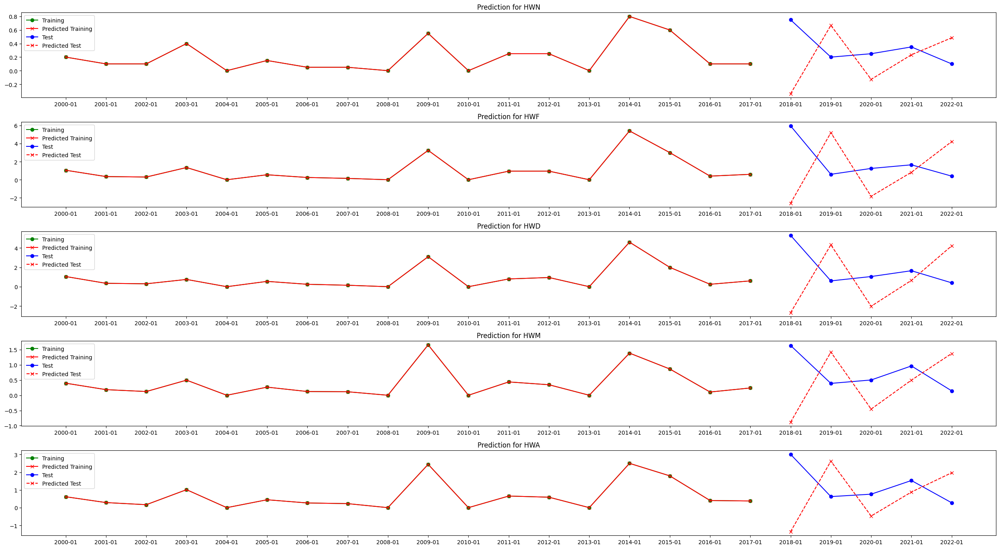

In [6]:
linear_stats[1] = model_predict(data[1], LinearRegression(), 5)

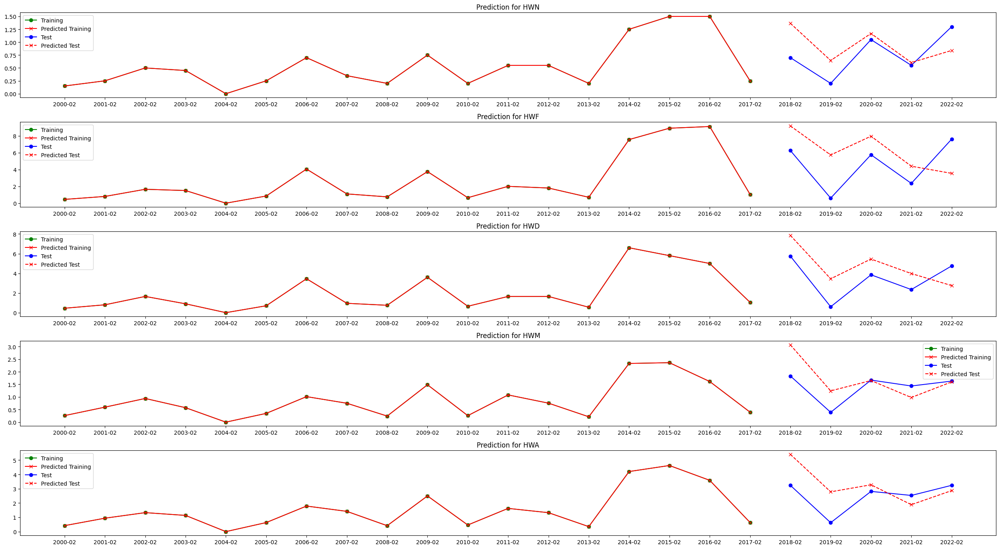

In [7]:
linear_stats[2] = model_predict(data[2], LinearRegression(), 5)

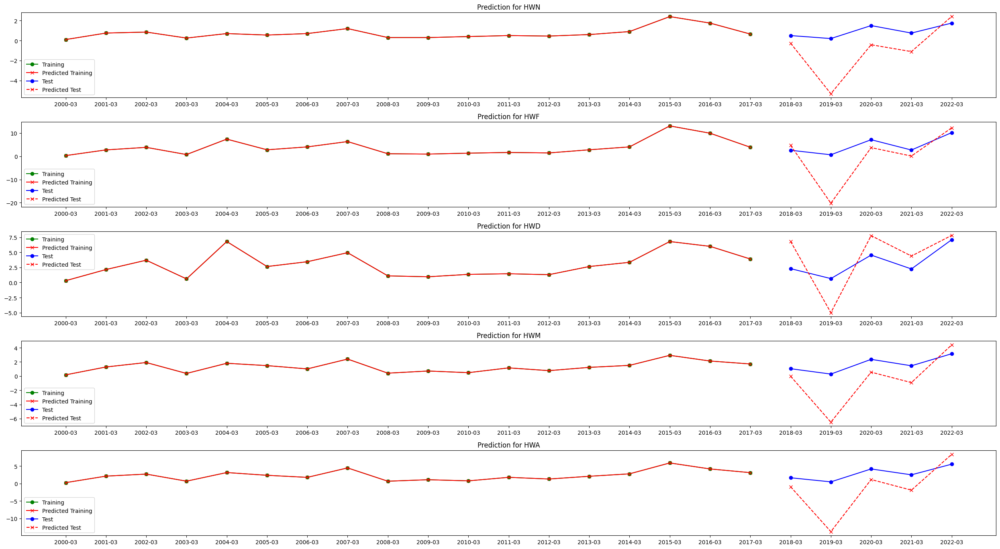

In [8]:
linear_stats[3] = model_predict(data[3], LinearRegression(), 5)

### RF

In [9]:
RF_stats = {}

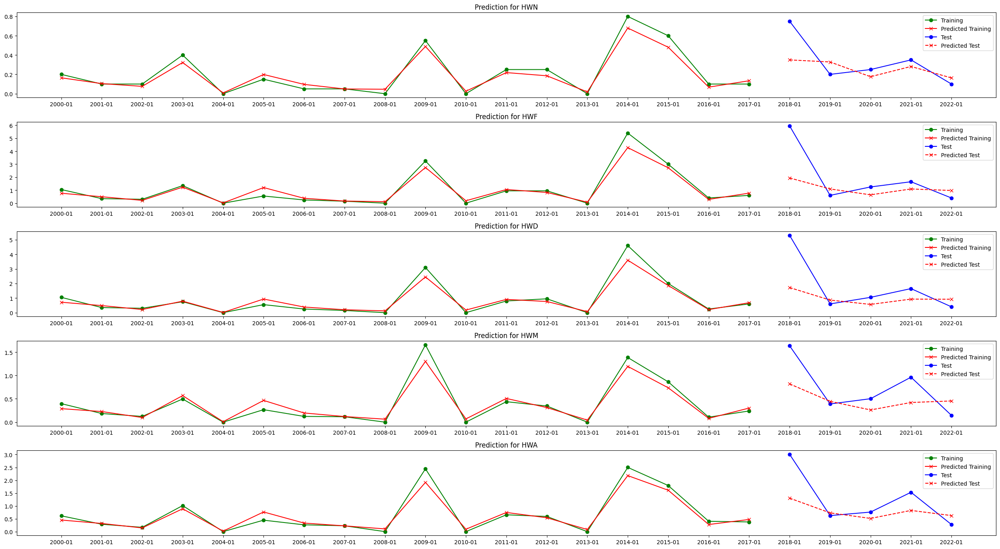

In [10]:
RF_stats[1] = model_predict(data[1], RandomForestRegressor(random_state=42, n_estimators=100), 5)

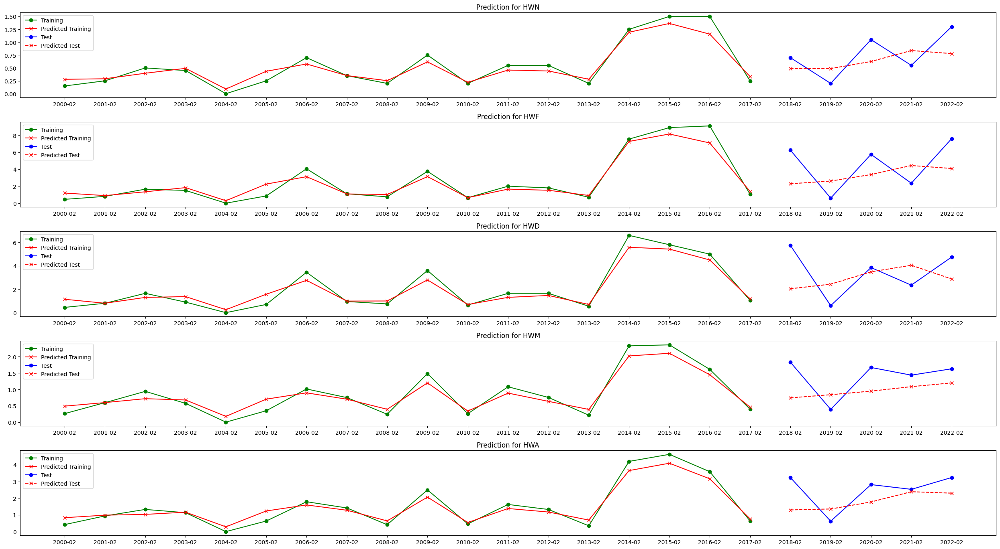

In [11]:
RF_stats[2] = model_predict(data[2], RandomForestRegressor(random_state=42, n_estimators=100), 5)

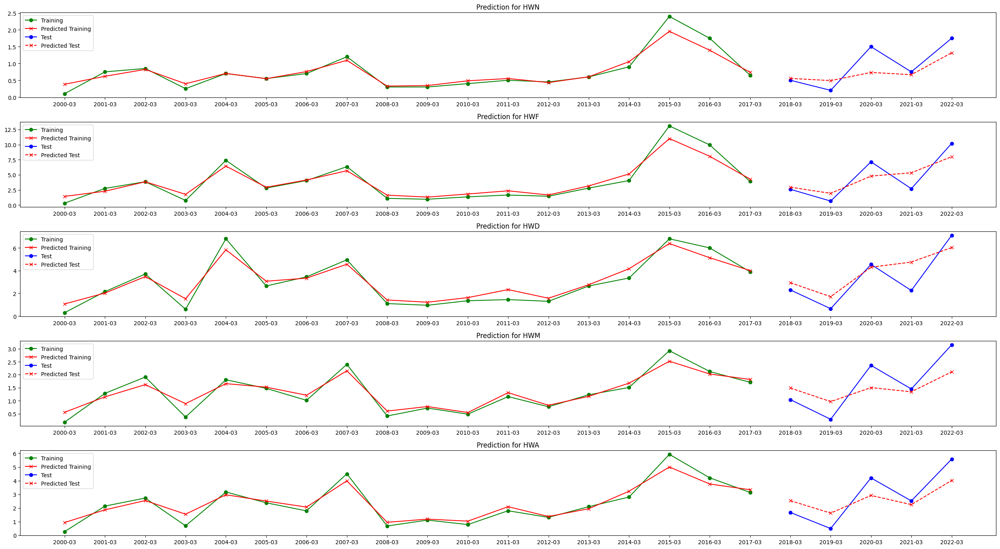

In [12]:
RF_stats[3] = model_predict(data[3], RandomForestRegressor(random_state=42, n_estimators=100), 5)

### SVC

In [13]:
svc_stats = {}

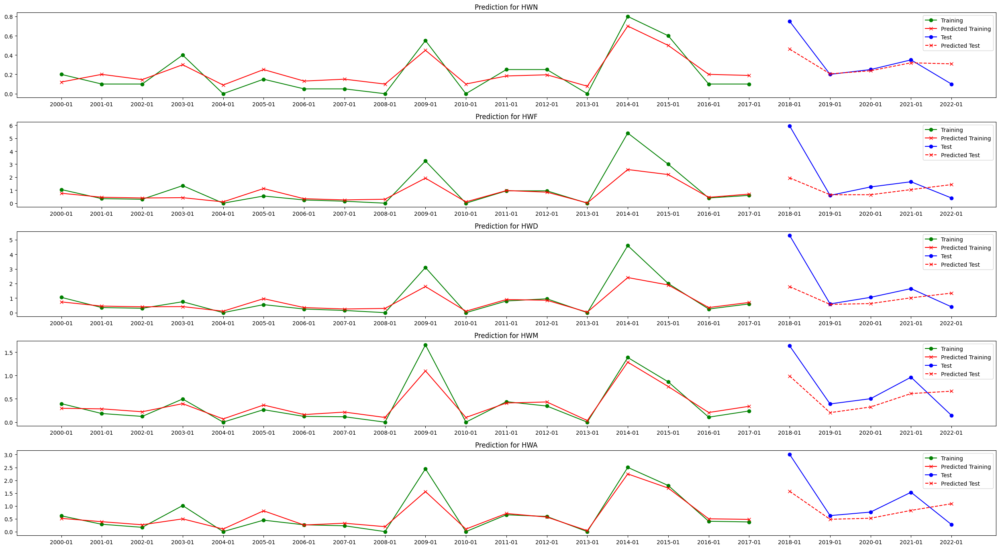

In [14]:
svc_stats[1] = model_predict(data[1], SVR(kernel='rbf') , 5)

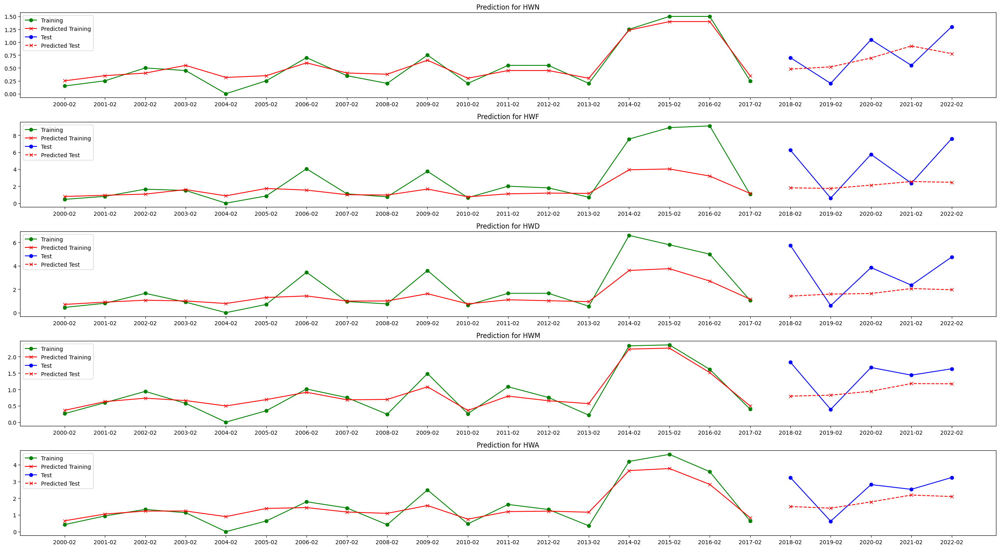

In [15]:
svc_stats[2] = model_predict(data[2], SVR(kernel='rbf') , 5)

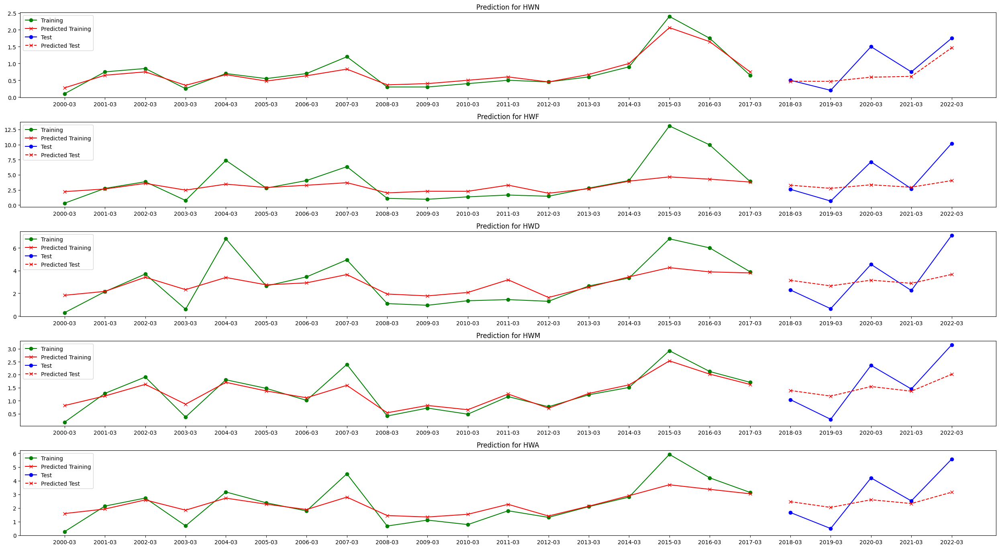

In [16]:
svc_stats[3] = model_predict(data[3], SVR(kernel='rbf') , 5)

### XGBoost

In [17]:
XGBoost_stats = {}

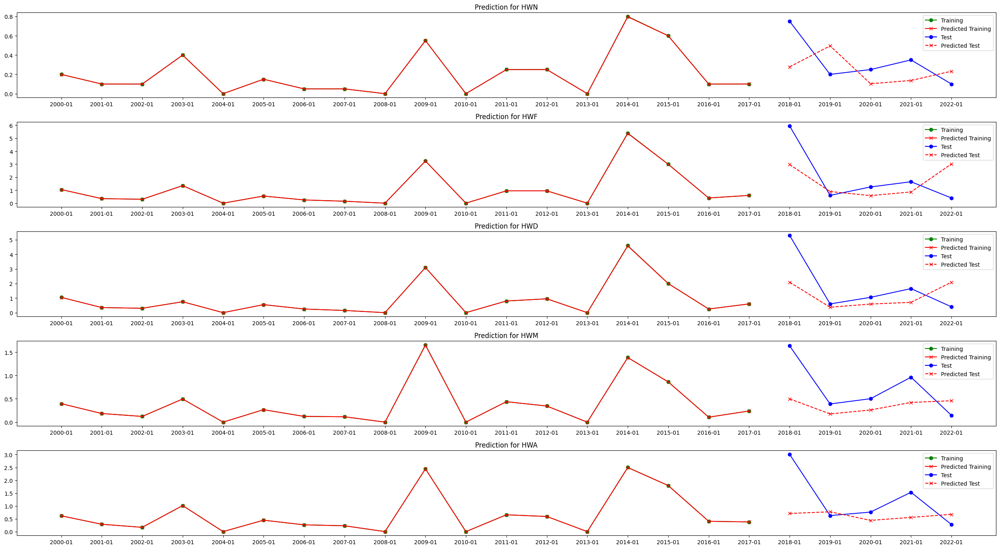

In [18]:
XGBoost_stats[1] = model_predict(data[1], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

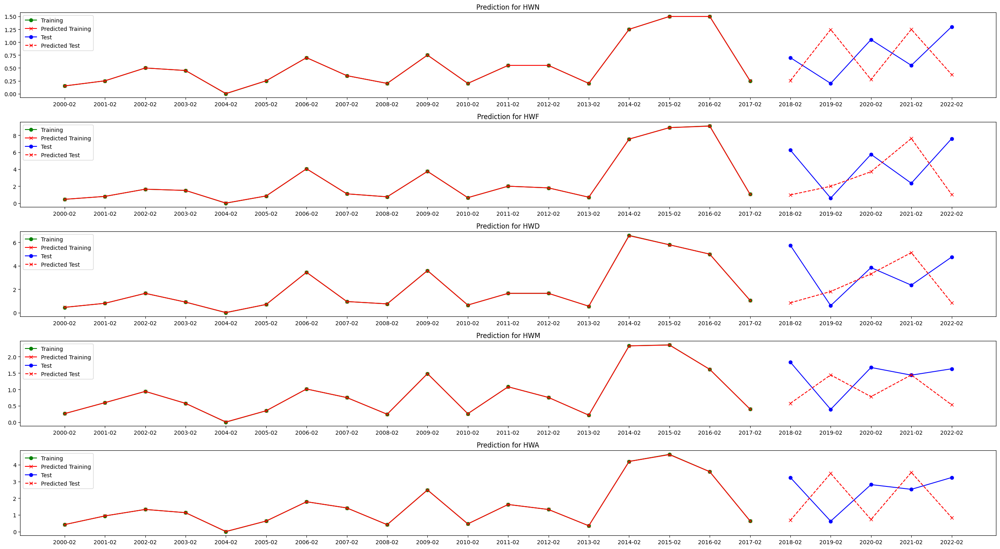

In [19]:
XGBoost_stats[2] = model_predict(data[2], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

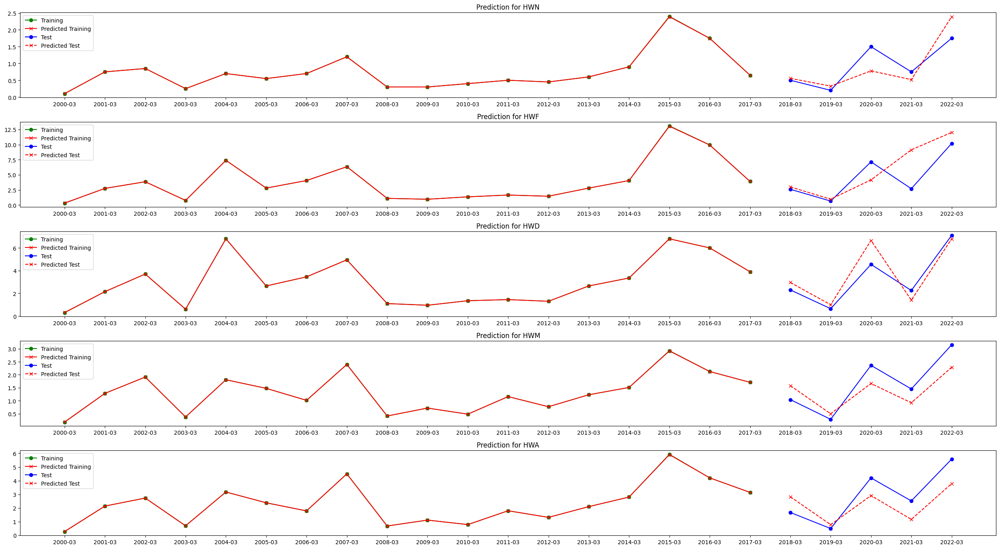

In [20]:
XGBoost_stats[3] = model_predict(data[3], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

### GaussianProcess Regressor

In [21]:
kernel = RBF(length_scale=1.0) + WhiteKernel(noise_level=1)
GPR_stats = {}

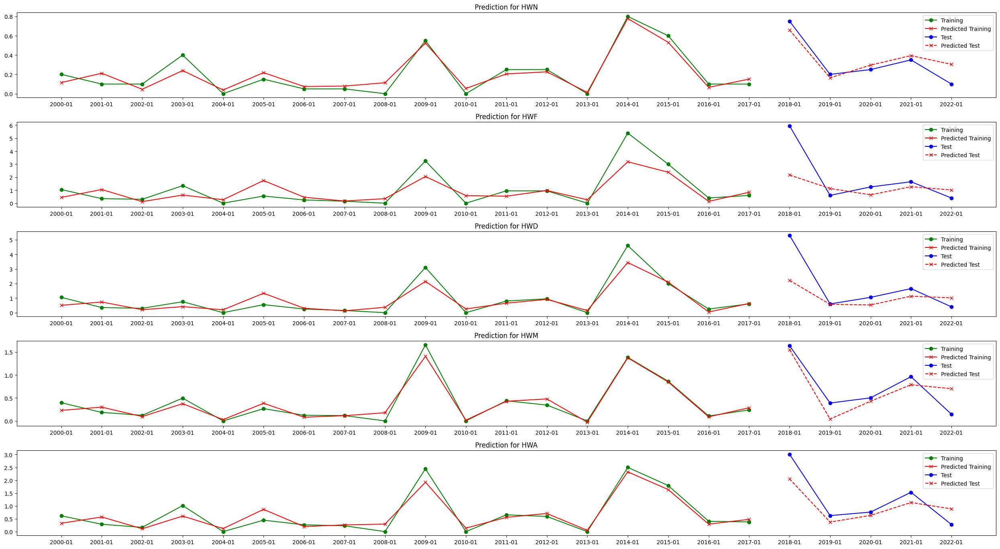

In [22]:
GPR_stats[1] = model_predict(data[1], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

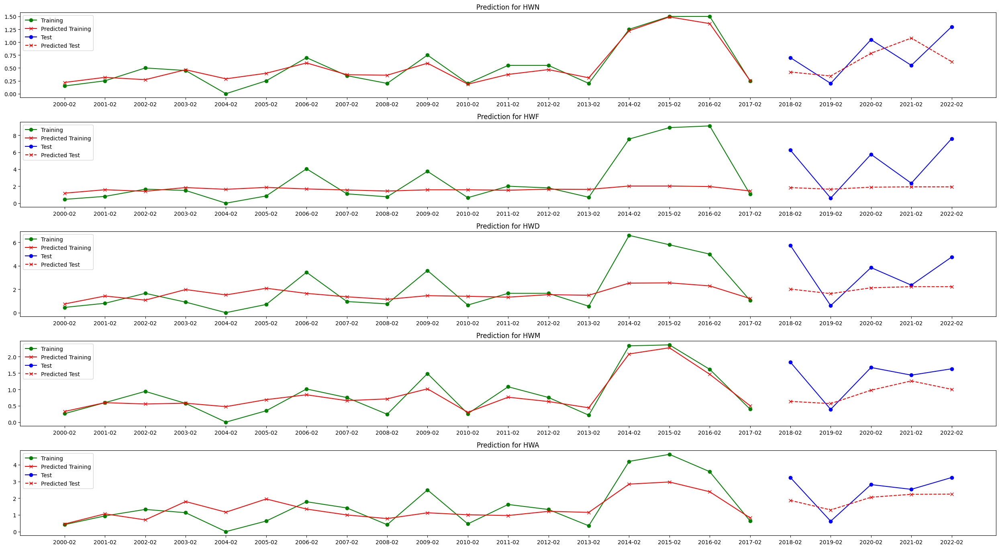

In [23]:
GPR_stats[2] = model_predict(data[2], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

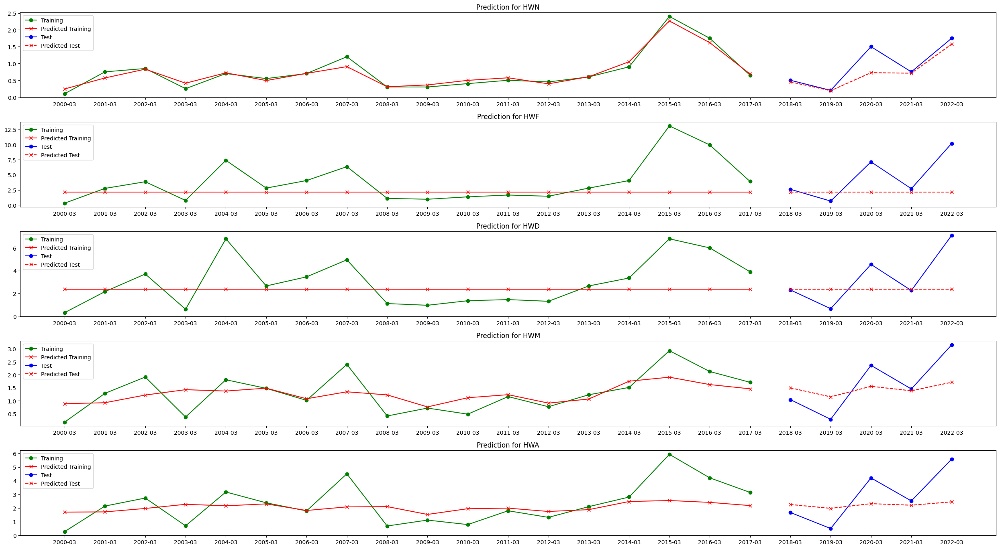

In [24]:
GPR_stats[3] = model_predict(data[3], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

### Results

In [25]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_mae_df.loc[len(results_mae_df.index)] = ["Linear", i] + linear_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["RF", i] + RF_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["SVC", i] + svc_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["XGBoost", i] + XGBoost_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["GPR", i] + GPR_stats[i][0]

results_mae_df.style.set_caption("MAE Model Results in Prediction").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,0.49,4.17,3.92,1.24,1.99
1,RF,1,0.15,1.25,1.11,0.39,0.62
2,SVC,1,0.11,1.26,1.11,0.38,0.67
3,XGBoost,1,0.25,1.47,1.31,0.49,0.83
4,GPR,1,0.08,1.18,0.95,0.25,0.47
5,Linear,2,0.35,3.27,2.04,0.52,1.16
6,RF,2,0.35,2.79,1.89,0.61,0.96
7,SVC,2,0.36,2.91,2.12,0.58,1.01
8,XGBoost,2,0.78,4.11,2.67,0.86,2.18
9,GPR,2,0.38,3.09,1.83,0.57,0.82


In [26]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["Linear", i] + linear_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["RF", i] + RF_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["SVC", i] + svc_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["GPR", i] + GPR_stats[i][1]

results_mae_df_training.style.set_caption("MAE Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,0.00,0.00,0.00,0.00,0.00
1,RF,1,0.04,0.24,0.21,0.09,0.13
2,SVC,1,0.09,0.44,0.33,0.11,0.18
3,XGBoost,1,0.00,0.00,0.00,0.00,0.00
4,GPR,1,0.06,0.56,0.32,0.07,0.19
5,Linear,2,0.00,0.00,0.00,0.00,0.00
6,RF,2,0.10,0.51,0.40,0.17,0.28
7,SVC,2,0.11,1.35,0.88,0.20,0.47
8,XGBoost,2,0.00,0.00,0.00,0.00,0.00
9,GPR,2,0.10,1.82,1.25,0.21,0.72


In [27]:
results_r2_df = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_r2_df.loc[len(results_r2_df.index)] = ["Linear", i] + linear_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["RF", i] + RF_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["SVC", i] + svc_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["XGBoost", i] + XGBoost_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["GPR", i] + GPR_stats[i][2]
results_r2_df.style.set_caption("R^2 Model Results").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,-5.76,-4.71,-5.32,-6.25,-4.86
1,RF,1,0.25,0.17,0.14,0.19,0.24
2,SVC,1,0.49,0.14,0.15,0.37,0.31
3,XGBoost,1,-0.56,0.19,0.12,-0.29,-0.38
4,GPR,1,0.78,0.26,0.36,0.66,0.68
5,Linear,2,-0.18,-0.77,-0.32,-0.85,-1.15
6,RF,2,0.10,-0.24,-0.43,-0.67,-0.33
7,SVC,2,0.06,-0.78,-0.98,-0.55,-0.30
8,XGBoost,2,-3.40,-2.08,-1.96,-2.52,-4.50
9,GPR,2,-0.23,-0.99,-0.48,-0.78,0.16


In [28]:
results_r2_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["Linear", i] + linear_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["RF", i] + RF_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["SVC", i] + svc_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["GPR", i] + GPR_stats[i][3]
results_r2_df_training.style.set_caption("R^2 Model Results Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,1.00,1.00,1.00,1.00,1.00
1,RF,1,0.94,0.94,0.93,0.93,0.94
2,SVC,1,0.85,0.67,0.72,0.88,0.87
3,XGBoost,1,1.00,1.00,1.00,1.00,1.00
4,GPR,1,0.91,0.70,0.85,0.95,0.90
5,Linear,2,1.00,1.00,1.00,1.00,1.00
6,RF,2,0.92,0.94,0.93,0.92,0.94
7,SVC,2,0.92,0.41,0.58,0.87,0.82
8,XGBoost,2,1.00,1.00,1.00,1.00,1.00
9,GPR,2,0.92,-0.01,0.26,0.85,0.56


##  JJ-JA-AS

### Linear Regression

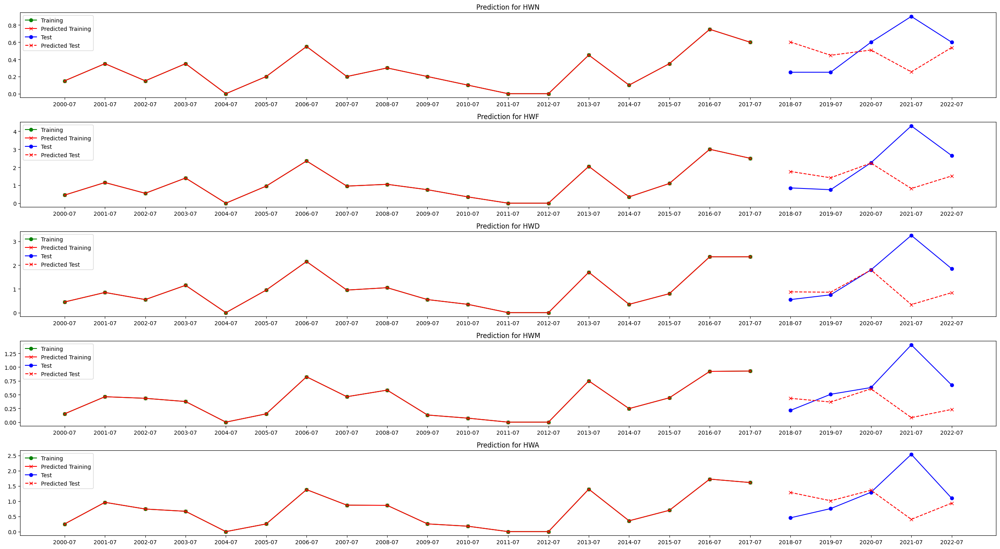

In [29]:
linear_stats[7] = model_predict(data[7], LinearRegression(), 5)

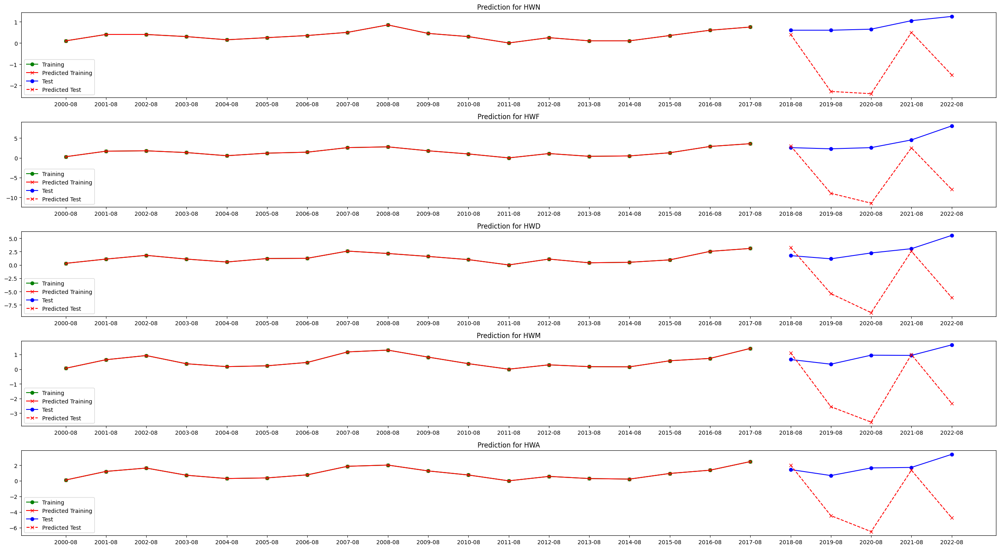

In [30]:
linear_stats[8] = model_predict(data[8], LinearRegression(), 5)

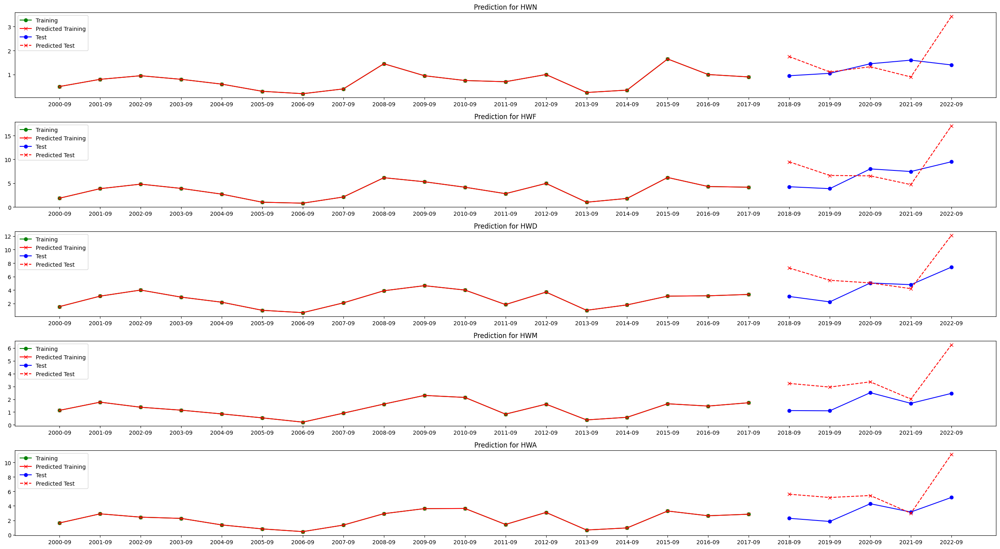

In [31]:
linear_stats[9] = model_predict(data[9], LinearRegression(), 5)

### RF

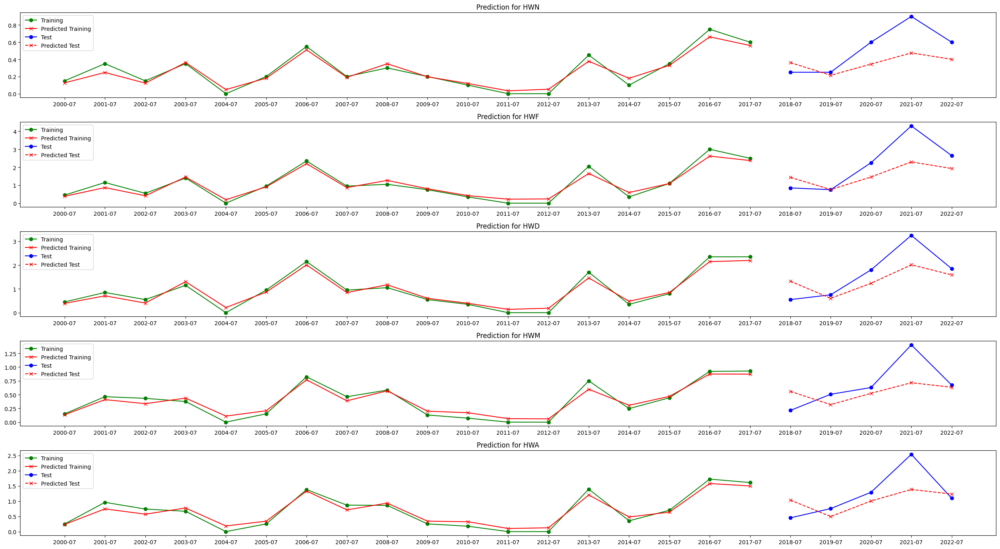

In [32]:
RF_stats[7] = model_predict(data[7], RandomForestRegressor(random_state=42, n_estimators=100), 5)

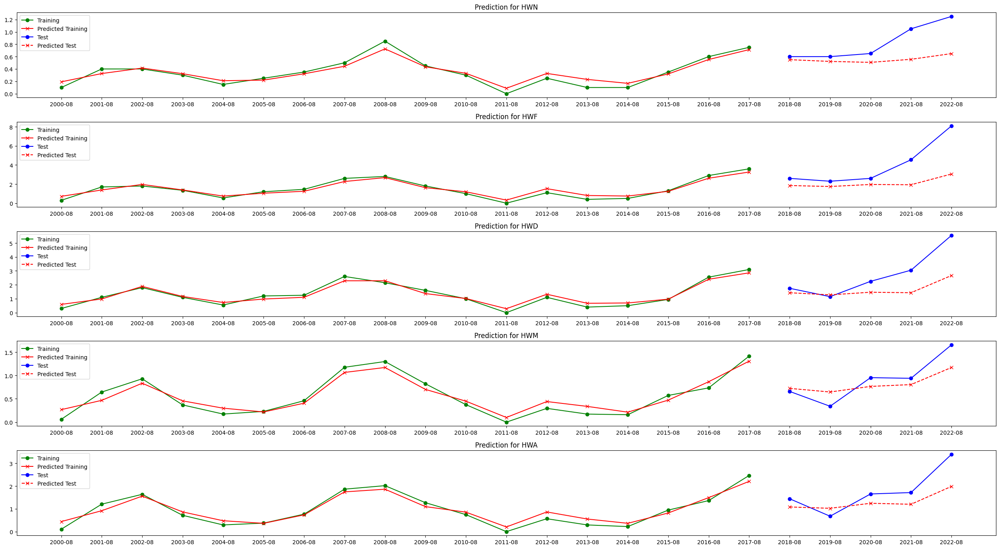

In [33]:
RF_stats[8] = model_predict(data[8], RandomForestRegressor(random_state=42, n_estimators=100), 5)

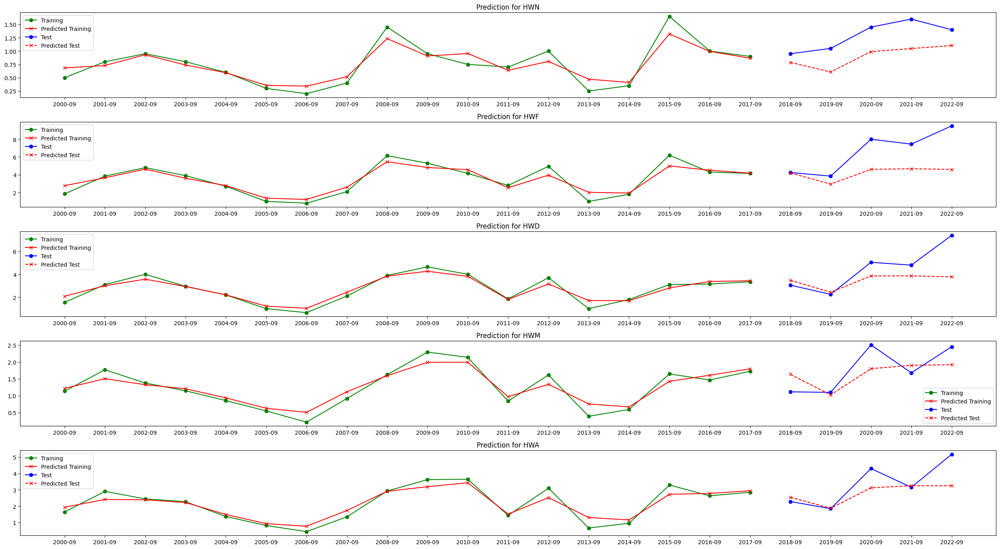

In [34]:
RF_stats[9] = model_predict(data[9], RandomForestRegressor(random_state=42, n_estimators=100), 5)

### SVC

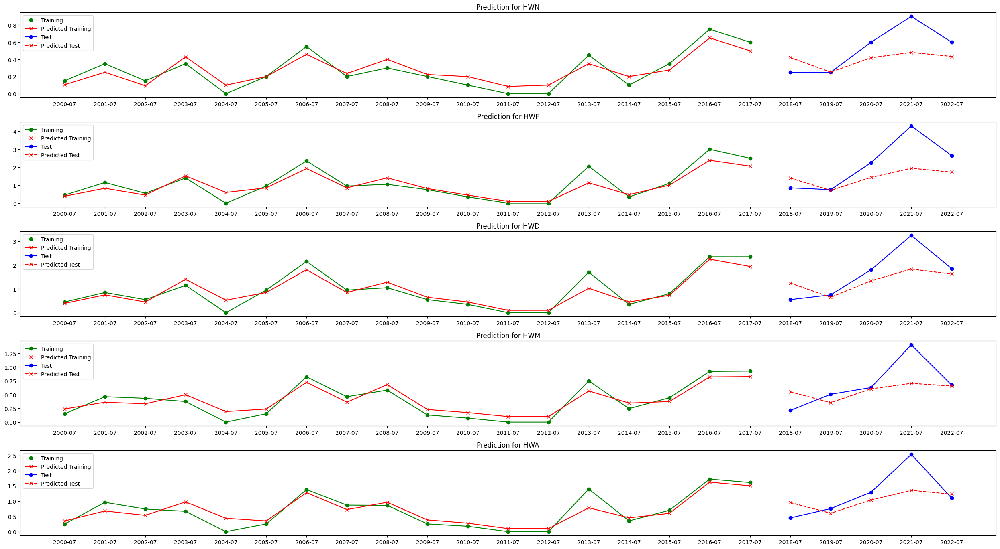

In [35]:
svc_stats[7] = model_predict(data[7], SVR(kernel='rbf') , 5)

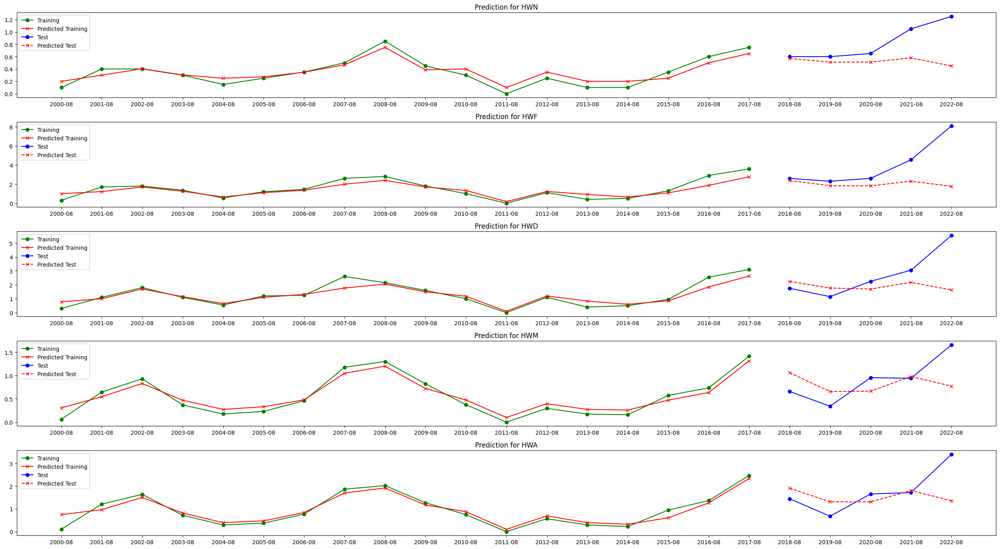

In [36]:
svc_stats[8] = model_predict(data[8], SVR(kernel='rbf') , 5)

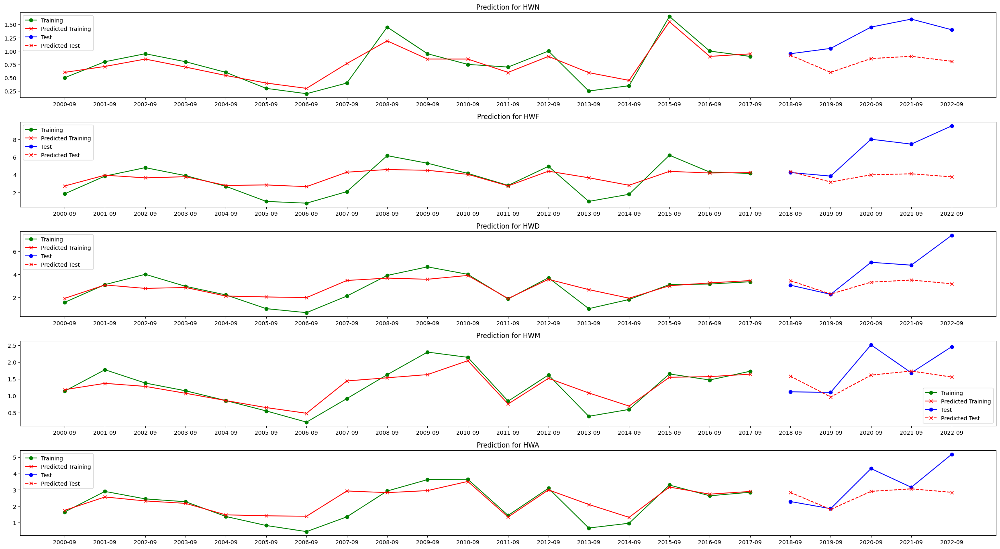

In [37]:
svc_stats[9] = model_predict(data[9], SVR(kernel='rbf') , 5)

### XGBoost

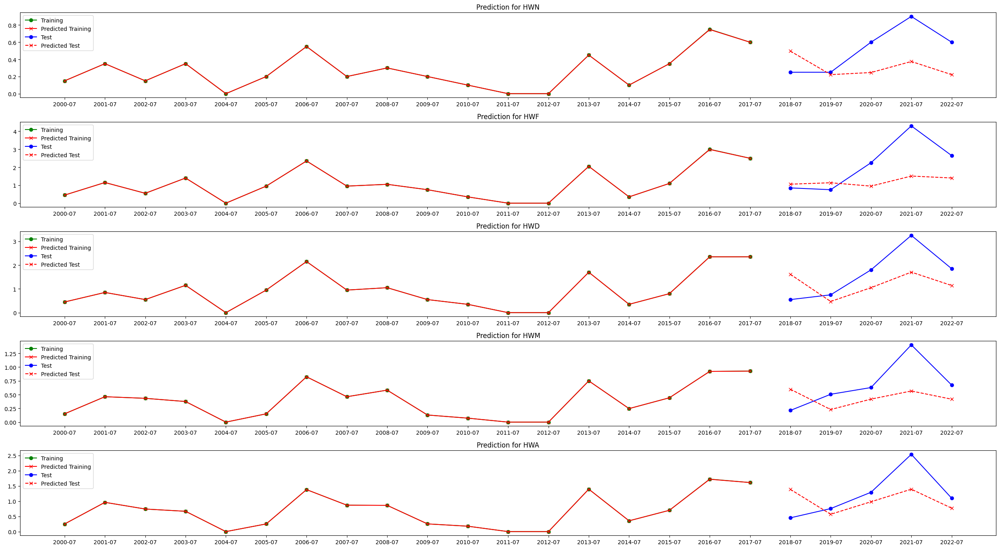

In [38]:
XGBoost_stats[7] = model_predict(data[7], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

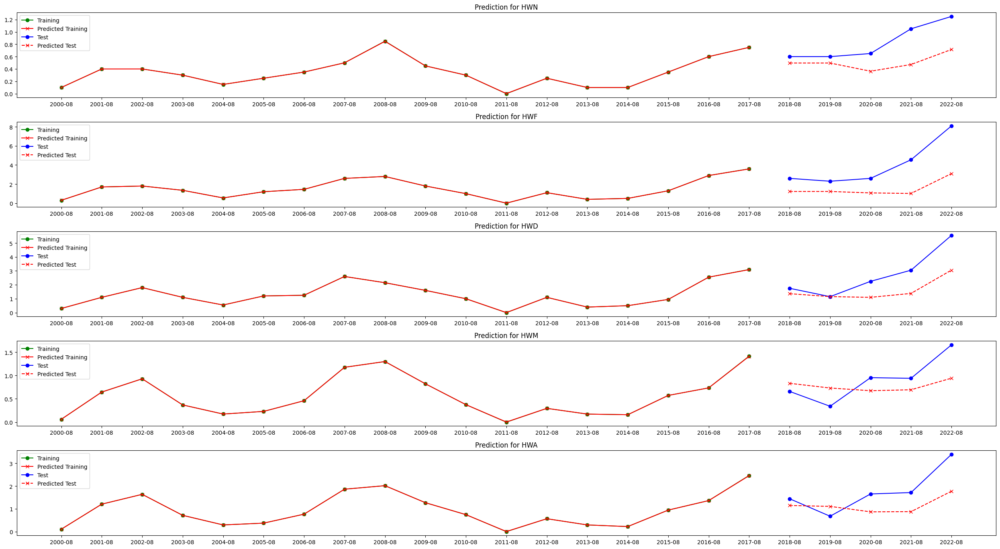

In [39]:
XGBoost_stats[8] = model_predict(data[8], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

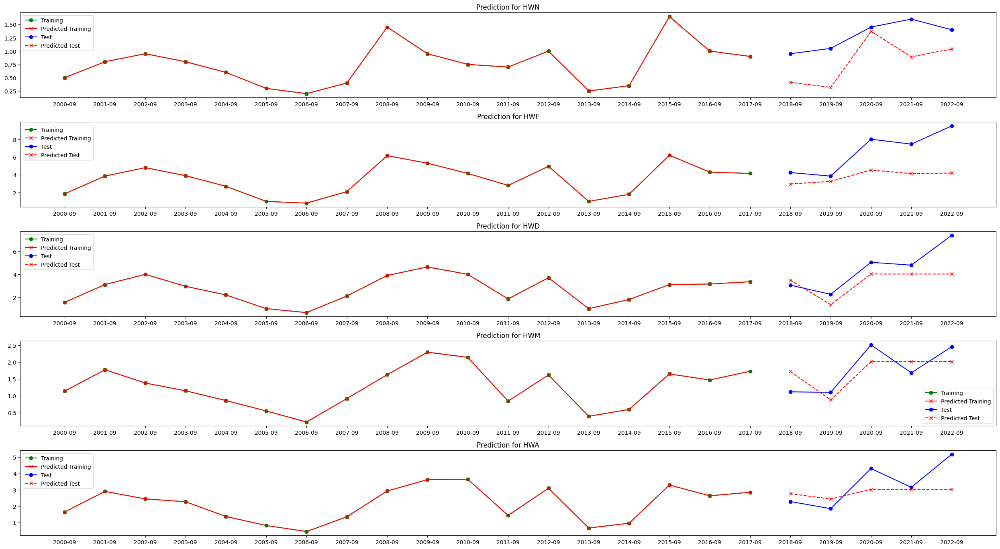

In [40]:
XGBoost_stats[9] = model_predict(data[9], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

### GPR

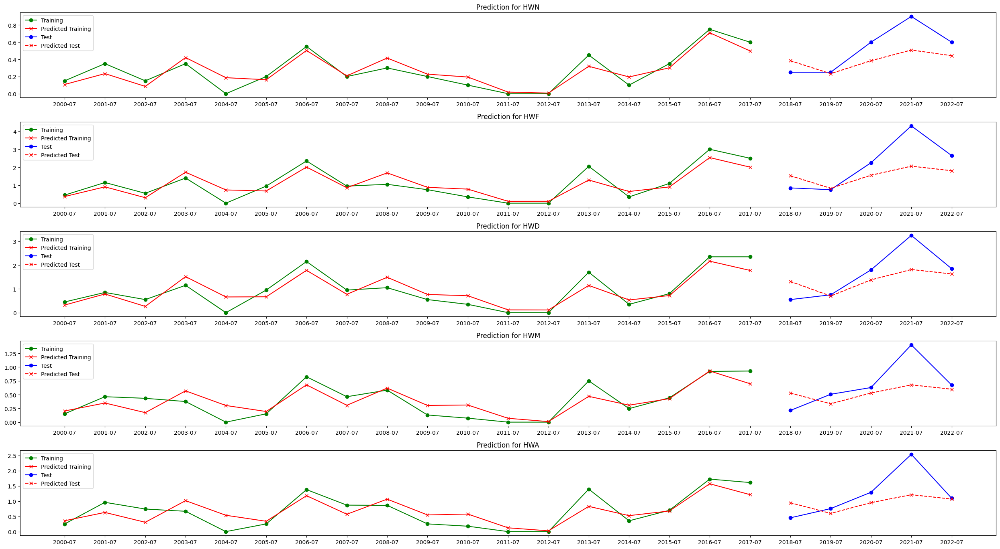

In [41]:
GPR_stats[7] = model_predict(data[7], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

c:\Users\marti\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\marti\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


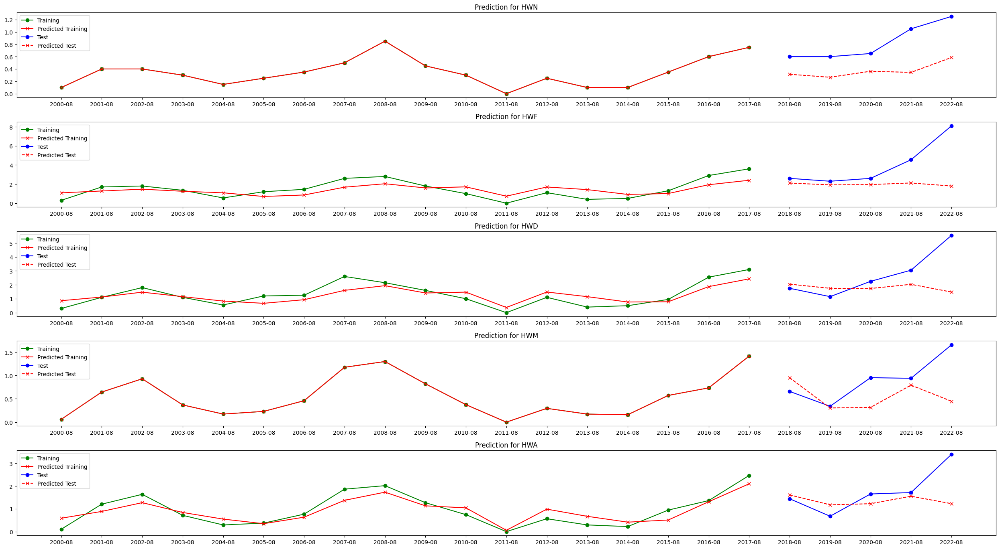

In [42]:
GPR_stats[8] = model_predict(data[8], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

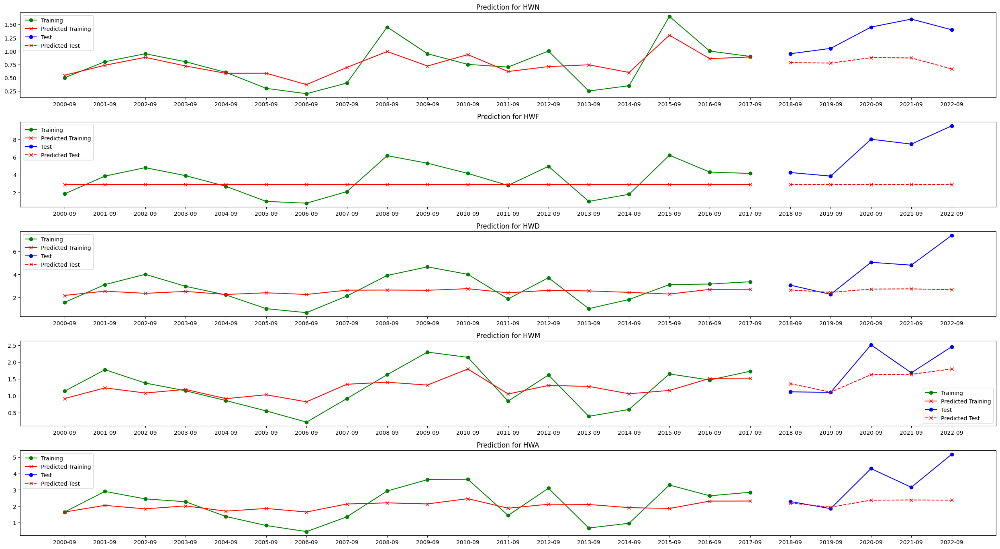

In [43]:
GPR_stats[9] = model_predict(data[9], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

### Results

In [44]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_mae_df.loc[len(results_mae_df.index)] = ["Linear", i] + linear_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["RF", i] + RF_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["SVC", i] + svc_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["XGBoost", i] + XGBoost_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["GPR", i] + GPR_stats[i][0]

results_mae_df.style.set_caption("MAE Model Results in Prediction").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.27,1.24,0.87,0.43,0.69
1,RF,7,0.21,0.82,0.60,0.27,0.48
2,SVC,7,0.19,0.94,0.58,0.25,0.44
3,XGBoost,7,0.31,1.19,0.87,0.39,0.58
4,GPR,7,0.18,0.91,0.58,0.28,0.47
5,Linear,8,1.88,8.77,6.29,2.39,4.47
6,RF,8,0.27,1.92,1.15,0.24,0.61
7,SVC,8,0.31,2.01,1.29,0.39,0.71
8,XGBoost,8,0.32,2.50,1.14,0.36,0.79
9,GPR,8,0.46,2.05,1.30,0.46,0.69


In [45]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["Linear", i] + linear_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["RF", i] + RF_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["SVC", i] + svc_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["GPR", i] + GPR_stats[i][1]

results_mae_df_training.style.set_caption("MAE Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.00,0.00,0.00,0.00,0.00
1,RF,7,0.04,0.16,0.13,0.07,0.12
2,SVC,7,0.08,0.26,0.20,0.11,0.18
3,XGBoost,7,0.00,0.00,0.00,0.00,0.00
4,GPR,7,0.07,0.33,0.29,0.13,0.26
5,Linear,8,0.00,0.00,0.00,0.00,0.00
6,RF,8,0.06,0.24,0.18,0.11,0.17
7,SVC,8,0.07,0.34,0.23,0.11,0.16
8,XGBoost,8,0.00,0.00,0.00,0.00,0.00
9,GPR,8,0.00,0.62,0.40,0.00,0.27


In [46]:
results_r2_df = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_r2_df.loc[len(results_r2_df.index)] = ["Linear", i] + linear_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["RF", i] + RF_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["SVC", i] + svc_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["XGBoost", i] + XGBoost_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["GPR", i] + GPR_stats[i][2]
results_r2_df.style.set_caption("R^2 Model Results").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,-0.96,-0.72,-1.07,-1.60,-1.09
1,RF,7,0.01,0.36,0.45,0.17,0.28
2,SVC,7,0.13,0.14,0.41,0.19,0.31
3,XGBoost,7,-0.99,-0.32,-0.00,-0.34,0.05
4,GPR,7,0.20,0.22,0.38,0.13,0.16
5,Linear,8,-69.22,-23.55,-25.18,-46.80,-39.34
6,RF,8,-0.75,-0.40,0.01,0.59,0.33
7,SVC,8,-1.46,-0.93,-0.45,-0.19,-0.24
8,XGBoost,8,-0.99,-0.79,0.11,0.12,-0.07
9,GPR,8,-2.35,-0.94,-0.56,-1.08,-0.31


In [47]:
results_r2_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["Linear", i] + linear_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["RF", i] + RF_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["SVC", i] + svc_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["GPR", i] + GPR_stats[i][3]
results_r2_df_training.style.set_caption("R^2 Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,1.00,1.00,1.00,1.00,1.00
1,RF,7,0.94,0.95,0.96,0.94,0.94
2,SVC,7,0.84,0.83,0.88,0.87,0.83
3,XGBoost,7,1.00,1.00,1.00,1.00,1.00
4,GPR,7,0.84,0.80,0.80,0.71,0.69
5,Linear,8,1.00,1.00,1.00,1.00,1.00
6,RF,8,0.91,0.92,0.94,0.92,0.92
7,SVC,8,0.86,0.79,0.84,0.93,0.91
8,XGBoost,8,1.00,1.00,1.00,1.00,1.00
9,GPR,8,1.00,0.50,0.68,1.00,0.81
